## Presentation preflight checklist:

* Remove all cell outputs
* Ensure ScummBar Rails kernel loaded
* Open fresh notebook in a new tab with ScummBar kernel loaded
* Start ScummBar Rails app


## Joyful Debugging with Jupyter Notebooks

### Hi 👋 I'm Robin.
### 🐣 <code>@funktoriell</code>
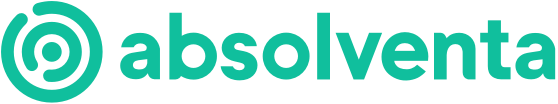



## We run job boards!
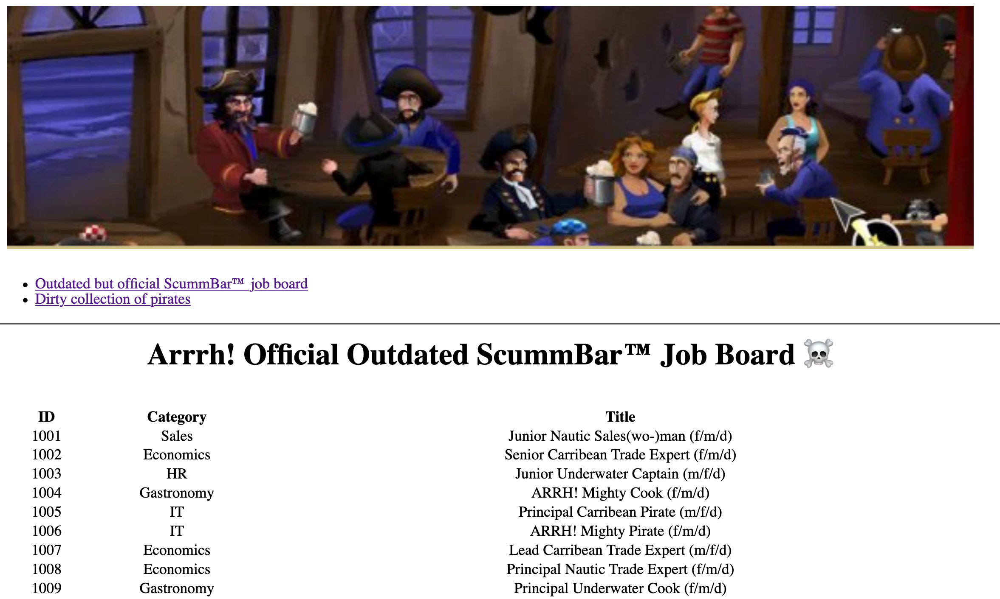

## Let's talk about debugging! 🤠

## Crafting, verifying, denying, accepting hypotheses about problems with your app 🔬

## Running, observing, repeating code to observe patterns or spot and understand problems 🔦

## local development environment vs. production environment


## simulation costs  vs. real operation risks 💇🏻‍♀️

## Sometimes there is practical business need to work with real production data 📀

## Running a Rails application? 
## <code class="code">heroku run console --app scumm-bar-production</code>
## Spawning ssh-REPL-sessions all the day


## Issues with ssh-REPL-only-production-data-debugging (mine) 

## Problem 1: Singular point of knowledge. 

* 1 dev, 1 machine
* no (async) knowledge sharing
* output hell 🙈
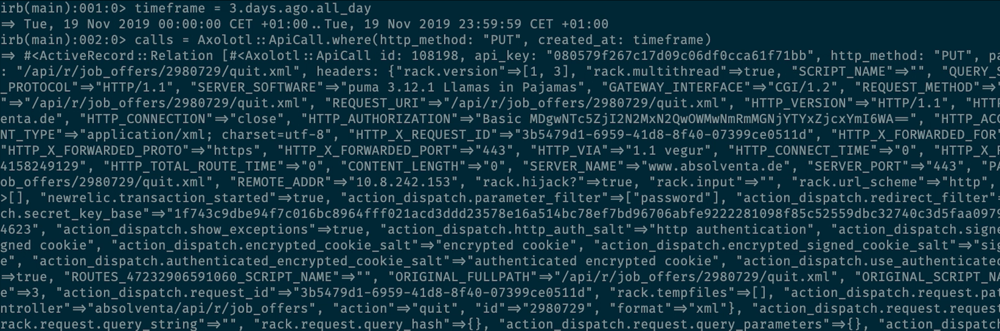


### Without explictly logging/copying it, there is almost _no_ chance to
* re-think the process more carefully later on
* re-cap the computed results under that environment later on
* repeat exactly (or similar) steps easily
* catch-up for your team mates

## Problem 2: Potentially stressful setup.
### Being on a ssh console session with full write access to the production database _can_ be harmful to your app, but at least it's a _stressful_ setup for you as a developer 🙀 

## Problem 3: Violation of engineering best practices
* endlessly repeating yourself (session closed, all code is gone, new session […])
* using crazy ad-hoc solutions even you know how to solve problems better (and forgetting what has been done a few hours later) 
* invites you to throw "good programming habits" away

## I like debugging 💚
## But I felt bad for doing this way.

## 🔥 Hot take 🔥

## Debugging is, at its core, deeply entangled with
## Exploratory Data Analysis


### They share conceptional techniques! 
* Summarizing data
* Spotting peaks & irregularities
* Zooming in into strange parts
* Looking for invariants
* Observing processes over time
…

## We should not feel bad for doing EDA. 
## We should embrace, foster and harness it 
## for our development process! 🔧 


# Why not borrow tooling from Data Science universe? 🤨 

https://jupyter.org
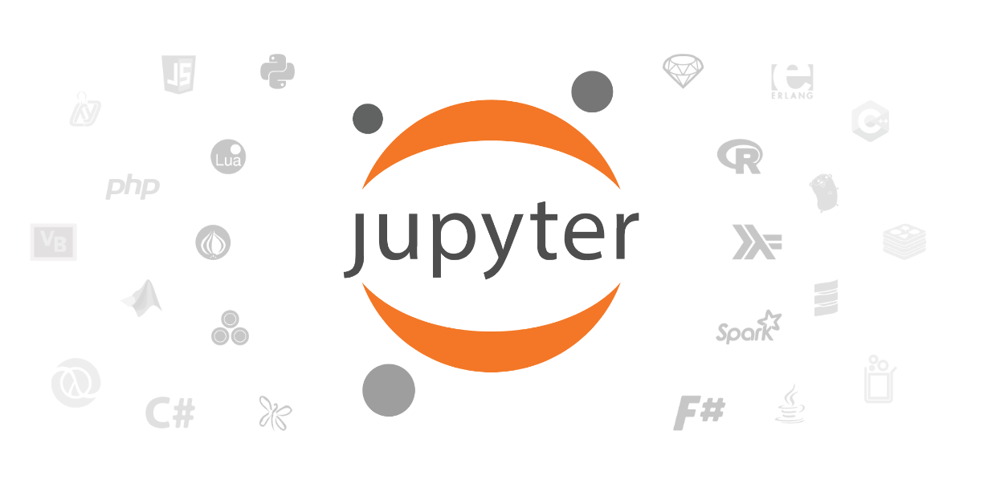

# The notion of a _notebook_:  An "annotated" REPL



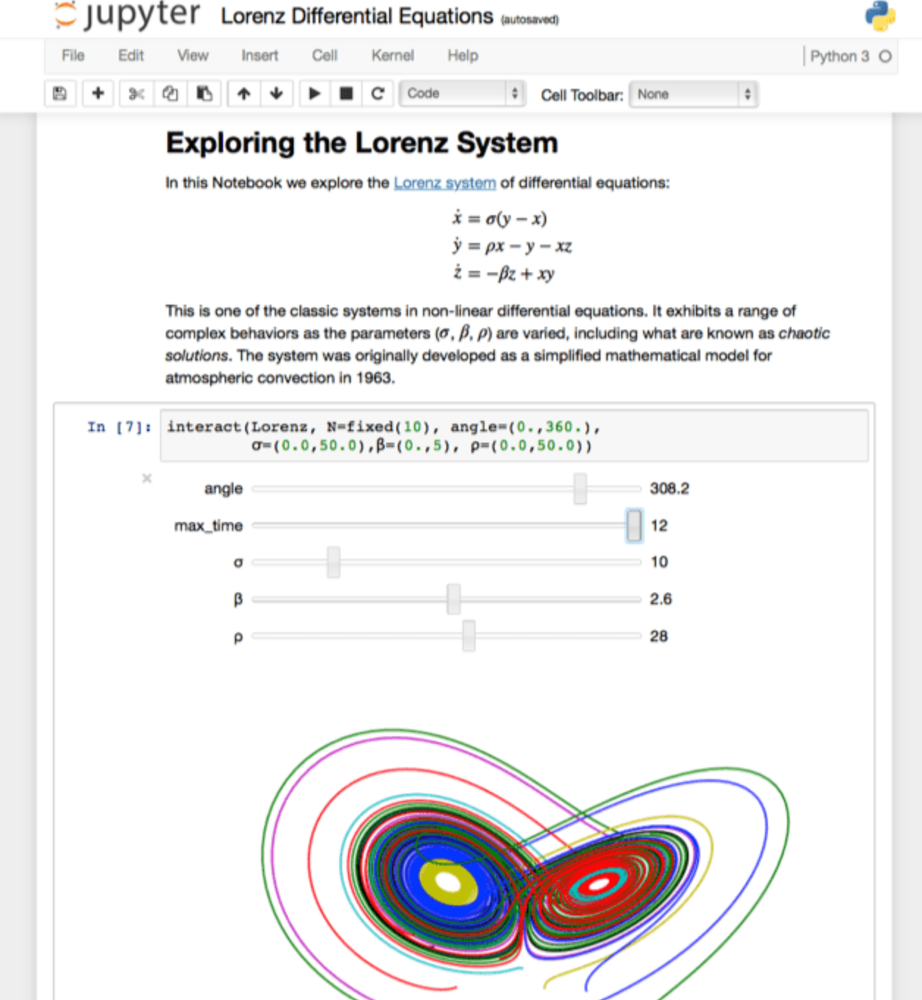

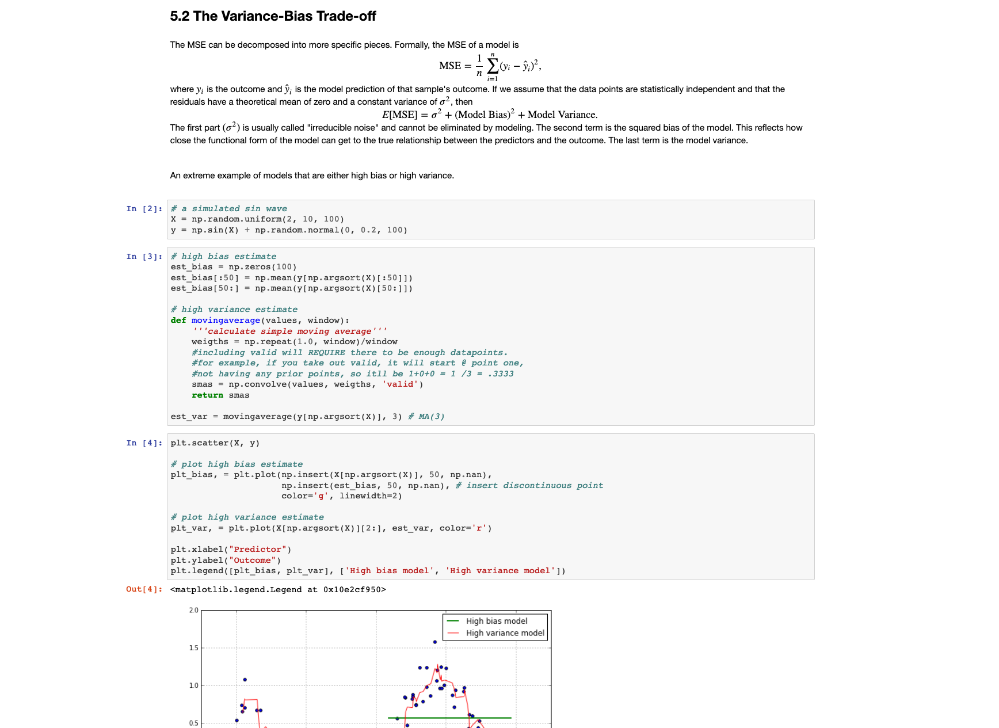

## 1980's _Computational Notebooks_

* Mathematica
* Maple
* Matlab

(source: Wikipedia, https://de.wikipedia.org/wiki/Mathematica#/media/Datei:Mathematica_dinis_surface.png

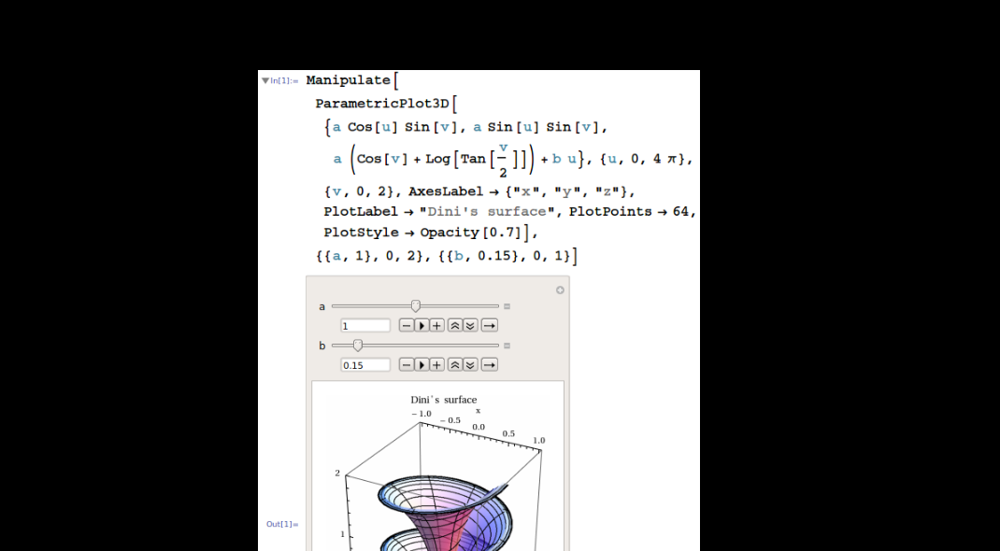


## Last decade: Open Source Notebook Tooling is a game changer for industry + academia

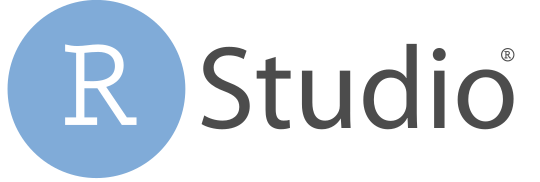
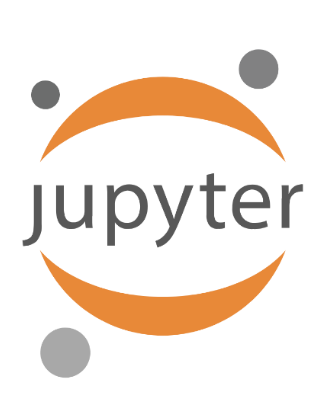



## A notebook is a sequence of cells and an interactive document


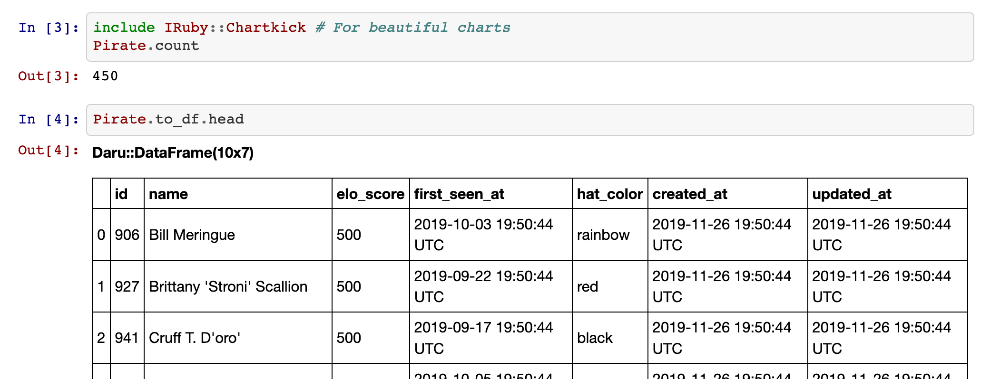

### In a nutshell 🐿
## Jupyter Notebook = REPL + Markdown notes + Visualizations

## This presentation is a notebook too! 🤓
$$\int K dvolg$$

In [3]:
[1,2,3].each { |n| puts n*n }

1
4
9


[1, 2, 3]

### Under the hood, a notebook is a JSON document
* jupyter spawns a web server
* Communication using JSON with AMQP-ish system
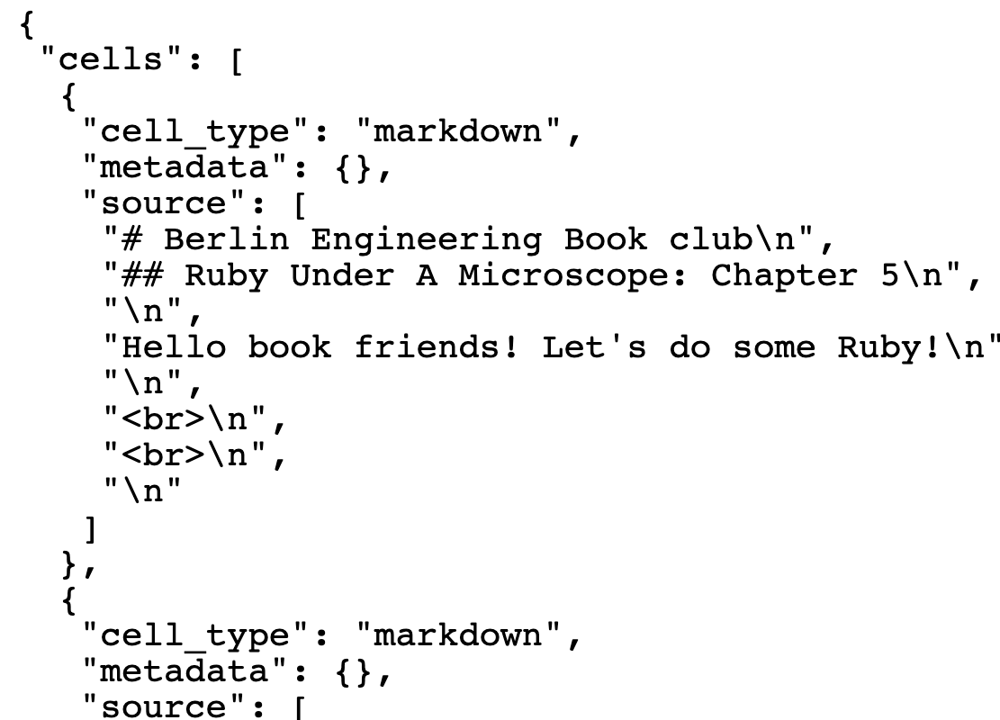


# Jupyter notebook has a _kernel_ loaded
###  (a programming language process that interprets the code cells and produces output cells)

## Default Kernels: *Ju*lia, *Py*thon, *R*

# There's also a Ruby kernel! ☀️

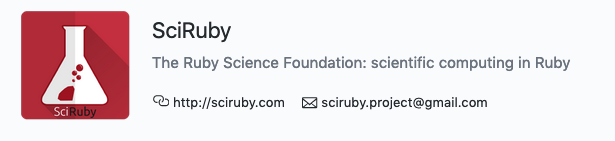
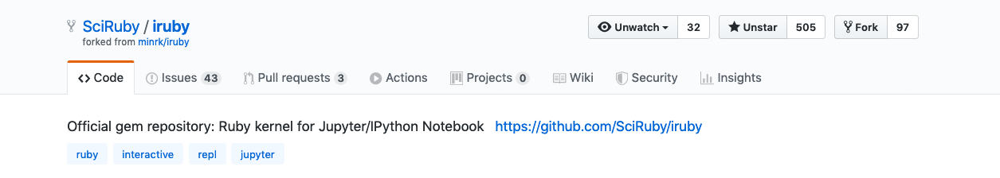

### Starting a notebook is easy, just run 

<code>$ jupyter-notebook</code>

### It starts a local web server serving the "notebook app" (let's do it a little later on!)

## Extremely useful: https://github.com/SciRuby/daru


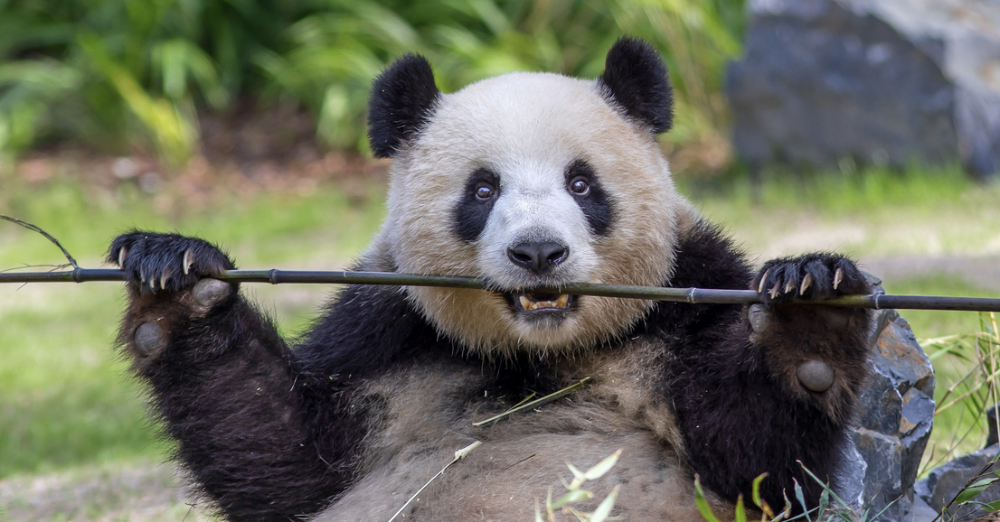
### "Pandas for Ruby"


In [4]:
require "daru"

df = Daru::DataFrame.new(
  island: ["Mêlée_Island", "Plunder Island", "Monkey Island"],
  monkey_population: [776, 166, 1329],
  size: [1, 10, 3]
)

,island,monkey_population,size
0,Mêlée_Island,776,1
1,Plunder Island,166,10
2,Monkey Island,1329,3


In [6]:
# Choose columns
df[:island]

,island
0,Mêlée_Island
1,Plunder Island
2,Monkey Island


In [7]:
# Sophisticated filtering
df.where(df[:size] > 1)
df.where(df[:island].eq("Plunder Island") | (df[:monkey_population] < 1000))


,island,monkey_population,size
0,Mêlée_Island,776,1
1,Plunder Island,166,10


In [8]:
owners = Daru::DataFrame.new(
  name: ["Bob", "Alice", "Julie"], pet_id: [1, 2, 2]
)
pets = Daru::DataFrame.new(
  name: ["Suzy", "Manfred", "George"], 
  pet_id: [1, 2, 3], 
  type: ["cat", "dinosaur", "dog"]
)

,name,pet_id,type
0,Suzy,1,cat
1,Manfred,2,dinosaur
2,George,3,dog


In [1]:
# You can join them together! 

## What about Rails?
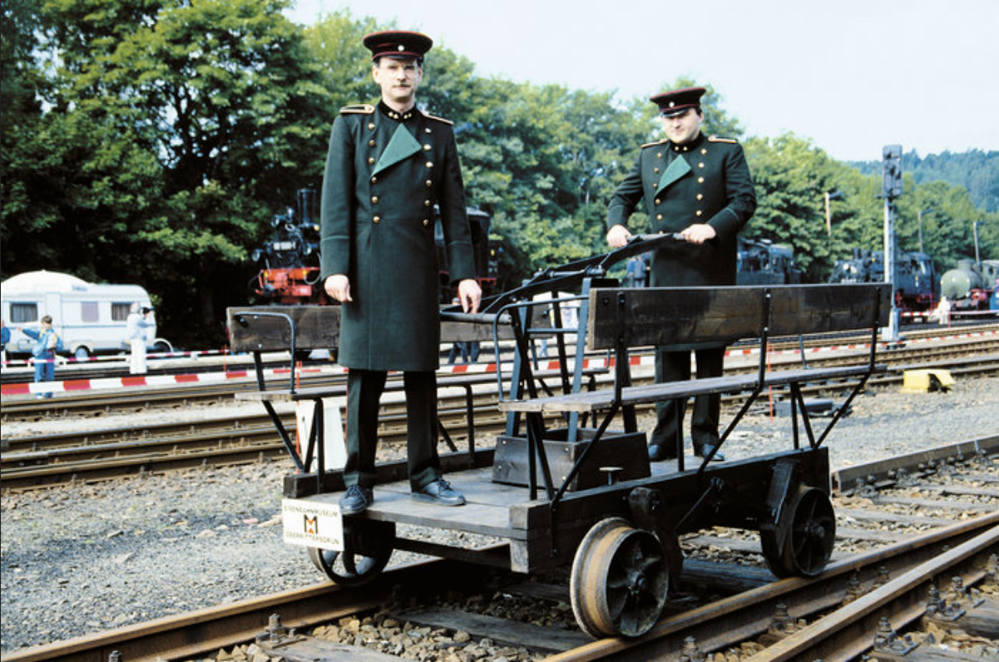


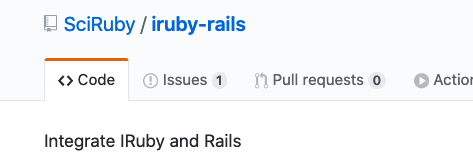
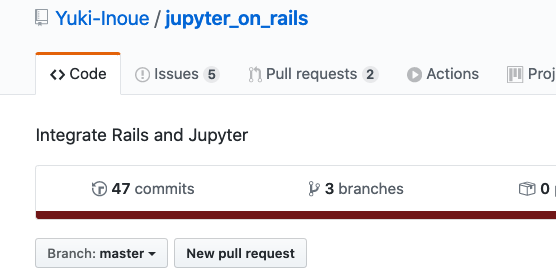


## Jupyter On Rails adds ActiveRecord extension for Daru
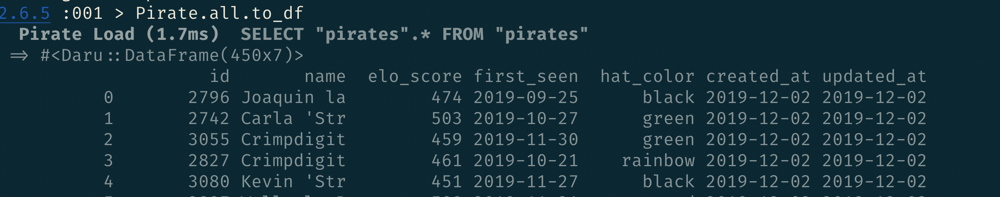

## Jupyter On Rails adds rake task for packaging your Rails app into a Ruby kernel
<code class="code">$ rake jupyter:notebook</code>

## You can use all your models etc in your notebook ☀️

# ✨ Visualization ✨

## Visualization: R has ggplot2 😍
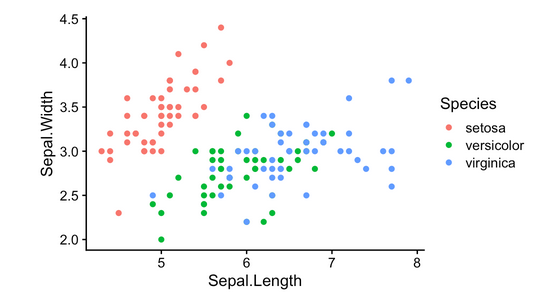

## Python has nice great visualization ecosystem, too!

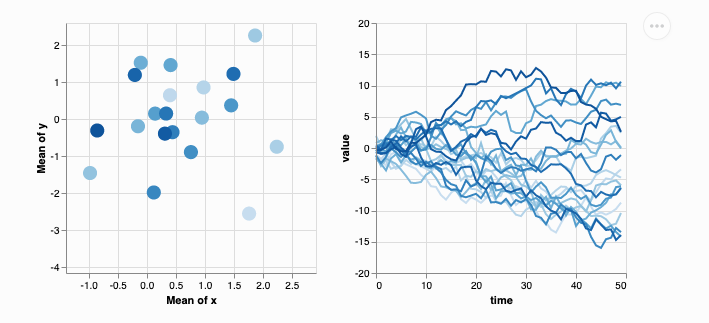

## (taken from "altair")

## Some visualization libraries - Ruby ecosystem

* https://github.com/domitry/nyaplot - can't make it work anymore - latest commit nearly 4 years ago 😢
* https://github.com/topfunky/gruff - latest commit nearly 4 years ago 😢
* https://github.com/SciRuby/gnuplotrb - also very nice!!
* https://github.com/SciRuby/rubyplot - did not try it yet 
* https://github.com/ankane/chartkick - my favourite!

### ☝️Possibly there are more



## Chartkick


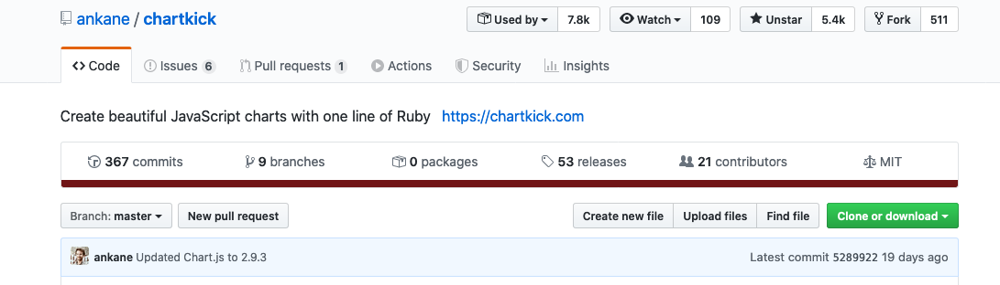
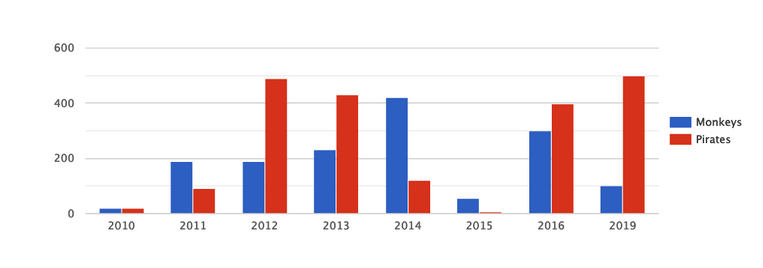

## We've made a little wrapper gem to combine it with iruby notebooks

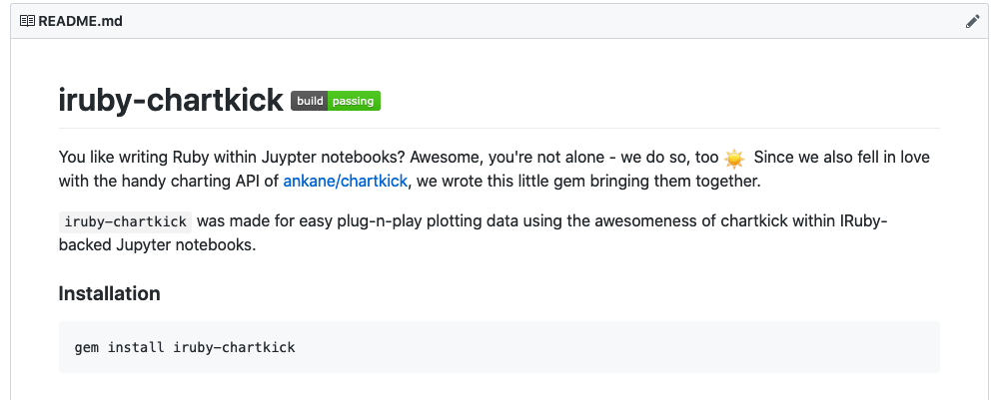

In [13]:
require "iruby/chartkick"
include IRuby::Chartkick
data = JobOffer.group_by_day(:created_at).size
bar_chart(data, points: false, max: 5)


"            <script type=\"text/javascript\">\n              (function(){var a=\"' of type \",l=\"SCRIPT\",p=\"Uneven number of arguments\",q=\"array\",t=\"function\",aa=\"google.charts.load\",ba=\"hasOwnProperty\",u=\"number\",v=\"object\",x=\"pre-45\",ca=\"propertyIsEnumerable\",y=\"string\",da=\"text/javascript\",ea=\"toLocaleString\";function A(){return function(b){return b}}function B(){return function(){}}function D(b){return function(){return this[b]}}function E(b){return function(){return b}}var F,G=G||{};G.scope={};\nG.Tk=function(b){var c=0;return function(){return c<b.length?{done:!1,value:b[c++]}:{done:!0}}};G.Sk=function(b){return{next:G.Tk(b)}};G.Dd=function(b){var c=\"undefined\"!=typeof Symbol&&Symbol.iterator&&b[Symbol.iterator];return c?c.call(b):G.Sk(b)};G.Rk=function(b){for(var c,d=[];!(c=b.next()).done;)d.push(c.value);return d};G.ve=function(b){return b instanceof Array?b:G.Rk(G.Dd(b))};\nG.$t=function(b,c,d){b instanceof String&&(b=String(b));for(var e=b.length,f=0;f<e;f++){var g=b[f];if(c.call(d,g,f,b))return{Bm:f,Oo:g}}return{Bm:-1,Oo:void 0}};G.Aj=!1;G.hp=!1;G.ip=!1;G.Nr=!1;G.defineProperty=G.Aj||typeof Object.defineProperties==t?Object.defineProperty:function(b,c,d){b!=Array.prototype&&b!=Object.prototype&&(b[c]=d.value)};G.fm=function(b){return\"undefined\"!=typeof window&&window===b?b:\"undefined\"!=typeof global&&null!=global?global:b};G.global=G.fm(this);\nG.Pc=function(b,c){if(c){var d=G.global;b=b.split(\".\");for(var e=0;e<b.length-1;e++){var f=b[e];f in d||(d[f]={});d=d[f]}b=b[b.length-1];e=d[b];c=c(e);c!=e&&null!=c&&G.defineProperty(d,b,{configurable:!0,writable:!0,value:c})}};G.Rg=function(b,c,d){if(null==b)throw new TypeError(\"The 'this' value for String.prototype.\"+d+\" must not be null or undefined\");if(c instanceof RegExp)throw new TypeError(\"First argument to String.prototype.\"+d+\" must not be a regular expression\");return b+\"\"};\nG.Pc(\"String.prototype.repeat\",function(b){return b?b:function(c){var d=G.Rg(this,null,\"repeat\");if(0>c||1342177279<c)throw new RangeError(\"Invalid count value\");c|=0;for(var e=\"\";c;)if(c&1&&(e+=d),c>>>=1)d+=d;return e}});G.$j=!1;\nG.Pc(\"Promise\",function(b){function c(k){this.qa=g.$a;this.Ia=void 0;this.ic=[];var m=this.De();try{k(m.resolve,m.reject)}catch(n){m.reject(n)}}function d(){this.pb=null}function e(k){return k instanceof c?k:new c(function(m){m(k)})}if(b&&!G.$j)return b;d.prototype.Ig=function(k){if(null==this.pb){this.pb=[];var m=this;this.Jg(function(){m.Ol()})}this.pb.push(k)};var f=G.global.setTimeout;d.prototype.Jg=function(k){f(k,0)};d.prototype.Ol=function(){for(;this.pb&&this.pb.length;){var k=this.pb;this.pb=\n[];for(var m=0;m<k.length;++m){var n=k[m];k[m]=null;try{n()}catch(r){this.el(r)}}}this.pb=null};d.prototype.el=function(k){this.Jg(function(){throw k;})};var g={$a:0,nb:1,Ja:2};c.prototype.De=function(){function k(r){return function(w){n||(n=!0,r.call(m,w))}}var m=this,n=!1;return{resolve:k(this.Qn),reject:k(this.sf)}};c.prototype.Qn=function(k){if(k===this)this.sf(new TypeError(\"A Promise cannot resolve to itself\"));else if(k instanceof c)this.no(k);else{a:switch(typeof k){case v:var m=null!=k;break a;\ncase t:m=!0;break a;default:m=!1}m?this.Pn(k):this.qh(k)}};c.prototype.Pn=function(k){var m=void 0;try{m=k.then}catch(n){this.sf(n);return}typeof m==t?this.oo(m,k):this.qh(k)};c.prototype.sf=function(k){this.aj(g.Ja,k)};c.prototype.qh=function(k){this.aj(g.nb,k)};c.prototype.aj=function(k,m){if(this.qa!=g.$a)throw Error(\"Cannot settle(\"+k+\", \"+m+\"): Promise already settled in state\"+this.qa);this.qa=k;this.Ia=m;this.Ql()};c.prototype.Ql=function(){if(null!=this.ic){for(var k=0;k<this.ic.length;++k)h.Ig(this.ic[k]);\nthis.ic=null}};var h=new d;c.prototype.no=function(k){var m=this.De();k.dd(m.resolve,m.reject)};c.prototype.oo=function(k,m){var n=this.De();try{k.call(m,n.resolve,n.reject)}catch(r){n.reject(r)}};c.prototype.then=function(k,m){function n(z,C){return typeof z==t?function(U){try{r(z(U))}catch(V)

## Some possible traps

* Notebooks carry a hidden state ☝️
* Replicability is better, but only on the surface 🤨
* Sometimes bad for teaching: Students are mindlessly executing stuff they do not understand

## Recap: Did my debugging cycles improve by that?
* Persistence + reproducibility of problem descriptions: Huge improvement for me 👍👍👍
* In contrast to caveats above: Notebooks encourage _me_ to extend our internal library ecosystem with (tested) abstractions exclusively for the notebooks 👍
* Far more joy by visualizations and data frames 👍
* I've spotted bugs only by making "arbitrary" visualizations for fun 👍👍👍!
* Solution for the "production data" problem: Connecting to production replika database from Jupyter notebook with READONLY access 👍

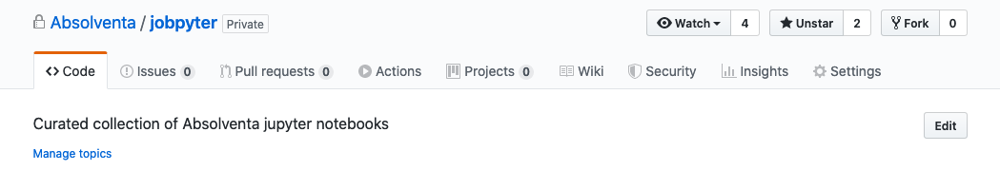
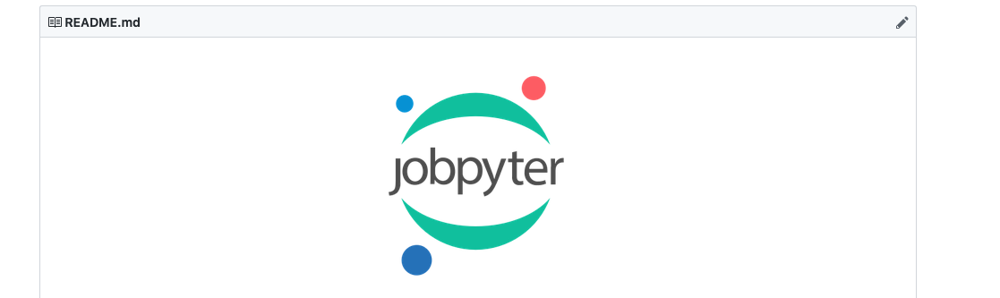

## Thanks for your time!